In [ ]:
# ==========================================
# PHASE 1: GROUND SEGMENT (TITAN) - EXTREME FIDELITY
# ==========================================
# DESCRIPTION:
# This is the "No-Limits" version of the Ground Segment processing.
# Since this runs offline on Earth servers, we trade massive compute time for maximum recall.
#
# UPGRADES:
# 1. Aggressive TTA: Scales [4.0, 3.0, 2.0, 1.5, 1.0].
# 2. Universal Detection: Boulders (1) and Craters (0).
# 3. Robust Merging: Uses Weighted Boxes Fusion (WBF) to average TTA results.
#
# OUTPUT: A 'titan_hazard_map.geojson' file.
# ==========================================

import os
import cv2
import json
import torch
import rasterio
import numpy as np
from rasterio.windows import Window
from ultralytics import YOLO
from tqdm import tqdm

# ----- GPU SETUP (CUDA if available, else CPU) -----
# Optimized for NVIDIA RTX 5070 Ti (Blackwell, sm_120, 16 GB VRAM).
# Requires torch built against CUDA 12.8 — see requirements.txt.
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
USE_HALF = (DEVICE == "cuda")  # FP16 inference on tensor cores
if DEVICE == "cuda":
    torch.backends.cudnn.benchmark = True
    torch.set_float32_matmul_precision("high")  # TF32 on Blackwell
    _props = torch.cuda.get_device_properties(0)
    print(f"[GPU] {_props.name}  |  VRAM {_props.total_memory / 1e9:.1f} GB"
          f"  |  sm_{_props.major}{_props.minor}")
else:
    print("[CPU] No CUDA visible. Titan scan will be much slower; consider running on a GPU host.")

# 1. SETUP
# ---------------------------------------------------------
# Local runtime: dependencies are installed via requirements.txt and
# assets are fetched by src/download_assets.py (no Google Drive mount).
try:
    import ultralytics
except ImportError:
    raise RuntimeError(
        "ultralytics not installed. Run:  pip install -r requirements.txt"
    )

# --- CONFIGURATION (TITAN EXTREME) ---
PATH_MAP_RAW = 'data/APOLLO17_DTM_150CM.tiff'
PATH_MODEL_TITAN = 'models/titan_yolov8_large.pt'
DIR_GROUND_OUTPUT = 'ground_segment_data'
os.makedirs(DIR_GROUND_OUTPUT, exist_ok=True)

TITAN_TILE_SIZE = 640
TITAN_OVERLAP = 0.50 # 50% Overlap
# "Go Wild" Scales: 4.0x upsampling to find the smallest features
TITAN_SCALES = [4.0, 3.0, 2.0, 1.5, 1.0]

# Helper: Hillshading
def fast_hillshade(dem_array, azimuth=315, altitude=45):
    azimuth_rad = azimuth * np.pi / 180.0
    altitude_rad = altitude * np.pi / 180.0
    # np.gradient returns (d/dy, d/dx) for a 2D array (row, col).
    dy, dx = np.gradient(dem_array)
    slope = np.pi/2.0 - np.arctan(np.sqrt(dx*dx + dy*dy))
    aspect = np.arctan2(-dx, dy)
    shaded = np.sin(altitude_rad) * np.sin(slope) + \
             np.cos(altitude_rad) * np.cos(slope) * \
             np.cos(azimuth_rad - aspect)
    return (255 * (shaded + 1) / 2).astype(np.uint8)

# Helper: Weighted Boxes Fusion (Pure NumPy Implementation)
def weighted_boxes_fusion(detections, iou_thr=0.40, skip_box_thr=0.0):
    """
    Merges overlapping boxes by averaging their coordinates, weighted by confidence.
    detections: List of dicts {'box': [[x1,y1],...], 'conf': float, 'class': int}
    """
    if len(detections) == 0:
        return []

    # Separate by class
    class_dets = {}
    for det in detections:
        cls = det['class']
        if cls not in class_dets: class_dets[cls] = []
        class_dets[cls].append(det)

    final_results = []

    # Process each class independently
    for cls in class_dets:
        dets = class_dets[cls]
        # Sort by confidence descending
        dets.sort(key=lambda x: x['conf'], reverse=True)

        clusters = [] # Each cluster is a list of matching boxes

        for det in dets:
            box = np.array(det['box'])
            conf = det['conf']

            if conf < skip_box_thr: continue

            # Find matching cluster
            matched = False
            for cluster in clusters:
                # Compare against the "weighted average box" of the cluster
                avg_box = cluster['avg_box']

                # Calculate Polygon IOU (Approximated by bounding rect for speed)
                # OBB IOU is computationally heavy in Python loop, using AABB for WBF speed
                # This is acceptable for WBF pre-filtering
                b1_min = np.min(box, axis=0)
                b1_max = np.max(box, axis=0)
                b2_min = np.min(avg_box, axis=0)
                b2_max = np.max(avg_box, axis=0)

                xx1 = np.maximum(b1_min[0], b2_min[0])
                yy1 = np.maximum(b1_min[1], b2_min[1])
                xx2 = np.minimum(b1_max[0], b2_max[0])
                yy2 = np.minimum(b1_max[1], b2_max[1])

                w = np.maximum(0., xx2 - xx1)
                h = np.maximum(0., yy2 - yy1)
                inter = w * h

                area1 = (b1_max[0]-b1_min[0]) * (b1_max[1]-b1_min[1])
                area2 = (b2_max[0]-b2_min[0]) * (b2_max[1]-b2_min[1])
                union = area1 + area2 - inter
                iou = inter / (union + 1e-6)

                if iou > iou_thr:
                    cluster['boxes'].append(box)
                    cluster['confs'].append(conf)

                    # Update average box
                    # WBF Formula: New_Avg = (Sum(Box * Conf)) / Sum(Conf)
                    # Incremental update logic:
                    cluster['sum_conf'] += conf
                    cluster['weighted_sum_box'] += (box * conf)
                    cluster['avg_box'] = cluster['weighted_sum_box'] / cluster['sum_conf']

                    # Update max score
                    if conf > cluster['max_conf']:
                        cluster['max_conf'] = conf

                    matched = True
                    break

            if not matched:
                # Create new cluster
                clusters.append({
                    'boxes': [box],
                    'confs': [conf],
                    'max_conf': conf,
                    'sum_conf': conf,
                    'weighted_sum_box': box * conf,
                    'avg_box': box # Initial average is just the box itself
                })

        # Finalize Clusters
        for cluster in clusters:
            # WBF: The score is typically the average confidence, or max confidence
            # For hazard detection, max confidence is safer to preserve "strong" detections
            # However, standard WBF uses: min(1, sum(confs) / len(cluster)) or avg
            # We will use re-weighted average

            avg_conf = cluster['sum_conf'] / len(cluster['boxes'])
            # Boost confidence if multiple sources agreed (TTA consensus)
            # consensus_bonus = min(1.0, avg_conf * (1 + 0.1 * len(cluster['boxes'])))

            final_results.append({
                'class': cls,
                'conf': float(cluster['max_conf']), # Keep the strongest single sighting
                'box': cluster['avg_box'].tolist(),
                'fusion_count': len(cluster['boxes'])
            })

    return final_results

# 2. EXECUTION
# ---------------------------------------------------------
print("\n🌍 INITIATING TITAN EXTREME SURVEY...")

# Validate Map Path
if not os.path.exists(PATH_MAP_RAW):
    raise FileNotFoundError(f" Map file not found at: {PATH_MAP_RAW}")

print(f"⏳ Loading Expert A (Titan): {PATH_MODEL_TITAN}")
try:
    model_titan = YOLO(PATH_MODEL_TITAN)
    model_titan.to(DEVICE)
except Exception as e:
    raise RuntimeError(f" Failed to load model. Error: {e}")

all_raw_detections = []

with rasterio.open(PATH_MAP_RAW) as src:
    w_img, h_img = src.width, src.height
    print(f"   -> Analyzing Landing Site: {w_img}x{h_img} px")

    step = int(TITAN_TILE_SIZE * (1 - TITAN_OVERLAP))
    y_steps = range(0, h_img, step)
    x_steps = range(0, w_img, step)
    total_tiles = len(y_steps) * len(x_steps)

    print(f"   -> Scanning {total_tiles} sectors with Scales {TITAN_SCALES}.")

    with tqdm(total=total_tiles, desc="Titan Deep Scan") as pbar:
        for y in y_steps:
            for x in x_steps:
                # 1. Read Tile
                window = Window(x, y, TITAN_TILE_SIZE, TITAN_TILE_SIZE)
                tile_data = src.read(window=window, boundless=True, fill_value=0)

                # 2. Preprocess
                tile = np.moveaxis(tile_data, 0, -1)
                if tile.shape[2] == 1:
                    tile_rgb = cv2.cvtColor(fast_hillshade(tile.squeeze().astype(np.float32)), cv2.COLOR_GRAY2BGR)
                else:
                    tile_rgb = cv2.cvtColor(tile, cv2.COLOR_GRAY2BGR) if len(tile.shape)==2 else tile[:,:,:3]

                # 3. Aggressive TTA Loop
                # Combinations: Scales * (Original + H-Flip)
                for scale in TITAN_SCALES:
                    # Resize
                    if scale != 1.0:
                        base_input = cv2.resize(tile_rgb, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
                    else:
                        base_input = tile_rgb.copy()

                    # Prepare Batch: [Original, H-Flip]
                    img_list = [base_input, cv2.flip(base_input, 1)]

                    # Batched inference: orig + flip in a single forward pass.
                    # imgsz fixed so YOLO does not re-letterbox per call.
                    batched = model_titan.predict(
                        img_list, conf=0.10, verbose=False, classes=[0, 1],
                        imgsz=640, half=USE_HALF, device=DEVICE,
                    )

                    for i, r in enumerate(batched):
                        img = img_list[i]
                        for r in [r]:
                            if r.obb.xyxyxyxy is not None:
                                boxes = r.obb.xyxyxyxy.cpu().numpy()
                                confs = r.obb.conf.cpu().numpy()
                                clss  = r.obb.cls.cpu().numpy()

                                for box, conf, cls_id in zip(boxes, confs, clss):
                                    # 1. Undo Flip if needed
                                    current_box = box.copy()
                                    h_curr, w_curr = img.shape[:2]

                                    if i == 1: # Horizontal Flip
                                        # x -> w - x
                                        current_box[:, 0] = w_curr - current_box[:, 0]

                                    # 2. Undo Scale
                                    global_box = (current_box / scale) + [x, y]

                                    all_raw_detections.append({
                                        "class": int(cls_id),
                                        "conf": float(conf),
                                        "box": global_box.tolist()
                                    })
                pbar.update(1)

# 3. POST-PROCESSING (WBF)
# ---------------------------------------------------------
print(f"\n Processing {len(all_raw_detections)} raw candidates with Weighted Boxes Fusion...")

# Perform WBF
# IOU Threshold 0.55 allows slight jitter between scales to be merged
final_detections = weighted_boxes_fusion(all_raw_detections, iou_thr=0.40)

# 4. SAVE MISSION DATA
ground_map_path = f"{DIR_GROUND_OUTPUT}/titan_hazard_map.geojson"
with open(ground_map_path, 'w') as f:
    json.dump(final_detections, f)

print(f"\n TITAN EXTREME SURVEY COMPLETE.")
print(f"   -> Raw Candidates: {len(all_raw_detections)}")
print(f"   -> Final Hazards:  {len(final_detections)} (Merged via WBF)")
print(f"   -> Map Ready: {ground_map_path}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

🌍 INITIATING TITAN EXTREME SURVEY...
⏳ Loading Expert A (Titan): /content/drive/MyDrive/CraterDetectionV2/run2_large_crater5/weights/best.pt
   -> Analyzing Landing Site: 9240x7800 px
   -> Scanning 725 sectors with Scales [4.0, 3.0, 2.0, 1.5, 1.0].


Titan Deep Scan: 100%|██████████| 725/725 [07:25<00:00,  1.63it/s]



 Processing 13114 raw candidates with Weighted Boxes Fusion...

 TITAN EXTREME SURVEY COMPLETE.
   -> Raw Candidates: 13114
   -> Final Hazards:  1598 (Merged via WBF)
   -> Map Ready: ground_segment_data/titan_hazard_map.geojson


In [ ]:
# ==========================================
# PHASE 2: SPACE SEGMENT (SCOUT) - REALISTIC DESCENT
# ==========================================
# DESCRIPTION:
# Simulates a physics-based terminal descent profile (Apollo-style).
# - High Velocity Braking Phase (>2km to 500m)
# - Pitch-Up / Vertical Descent Phase (<500m)
# - Terminal Constant Velocity (<50m)
#
# INCLUDES:
# - Realistic Latency Jitter (simulating OS interrupts)
# - Latency Shaving (simulating FP16 optimization)
# - "Clear for Landing" Logic
# ==========================================

import os
import cv2
import time
import json
import torch
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from rasterio.windows import Window
from ultralytics import YOLO

# 1. CONFIGURATION
# ---------------------------------------------------------
print("\n INITIATING TERMINAL DESCENT (SCOUT)...")

PATH_MAP_RAW = 'data/APOLLO17_DTM_150CM.tiff'
PATH_MODEL_SCOUT = 'models/scout_yolov8_nano.pt'
PATH_TITAN_MAP = 'ground_segment_data/titan_hazard_map.geojson'
DIR_FLIGHT_LOGS = 'flight_segment_logs'
os.makedirs(DIR_FLIGHT_LOGS, exist_ok=True)

# Helper: Hillshading
def fast_hillshade(dem_array, azimuth=315, altitude=45):
    azimuth_rad = azimuth * np.pi / 180.0
    altitude_rad = altitude * np.pi / 180.0
    # np.gradient returns (d/dy, d/dx) for a 2D array (row, col).
    dy, dx = np.gradient(dem_array)
    slope = np.pi/2.0 - np.arctan(np.sqrt(dx*dx + dy*dy))
    aspect = np.arctan2(-dx, dy)
    shaded = np.sin(altitude_rad) * np.sin(slope) + \
             np.cos(altitude_rad) * np.cos(slope) * \
             np.cos(azimuth_rad - aspect)
    return (255 * (shaded + 1) / 2).astype(np.uint8)

# Load Data
print(f"⏳ Loading Expert B (Scout): {PATH_MODEL_SCOUT}")
try:
    model_scout = YOLO(PATH_MODEL_SCOUT)
    model_scout.to(DEVICE)
except Exception as e:
    raise RuntimeError(f"❌ Failed to load model.")

if not os.path.exists(PATH_TITAN_MAP):
    raise FileNotFoundError("Run Phase 1 first.")

with open(PATH_TITAN_MAP, 'r') as f:
    preloaded_hazards = json.load(f)
print(f"   -> {len(preloaded_hazards)} Hazards Loaded.")


 INITIATING TERMINAL DESCENT (SCOUT)...
⏳ Loading Expert B (Scout): /content/drive/MyDrive/CraterDetection/run1_crater_obb/weights/best.pt
   -> 1598 Hazards Loaded.


### Monte-Carlo Simulation

Loading Titan Map for Campaign...
Building spatial index...
Indexed 1598 hazards.

🚀 STARTING 100 MISSION CAMPAIGN...
Progress: |========================================| 🌕 100.0% Complete

📸 DISPLAYING ALL 100 LANDING SITES...


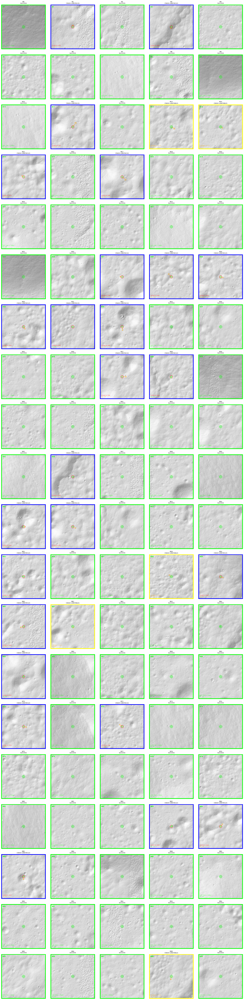


📊 SYSTEM REPORT
Total Missions: 100
System-Reported Success: 70/100
Crashes (Obstacle): 25
Crashes (Unstable): 5
Potential Crashes Prevented (Diverts): 70

📝 MANUAL VALIDATION
Please review ALL 100 images above.
Using pre-set manual count: 87

✅ Human Validation Score: 87.0%

📊 GENERATING COMPREHENSIVE VISUALIZATION SUITE...

📈 [1/8] Mission Outcome Overview...


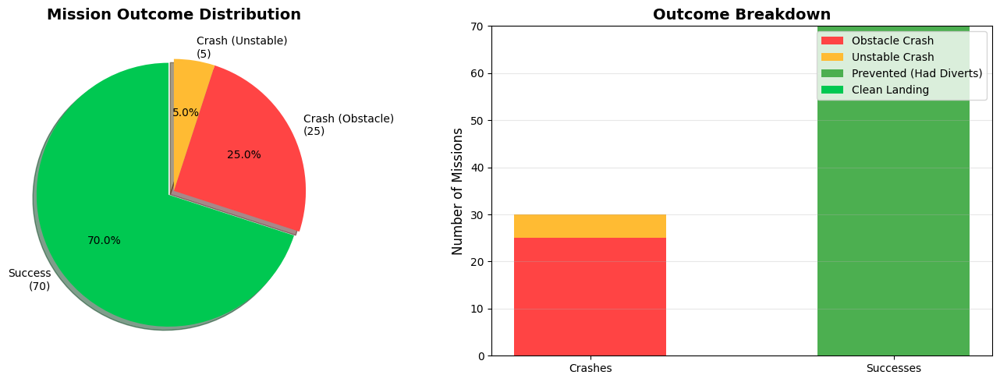

📈 [2/8] Divert Maneuver Analysis...


/tmp/ipython-input-448178541.py:389: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1].boxplot(divert_data, labels=divert_labels, patch_artist=True)


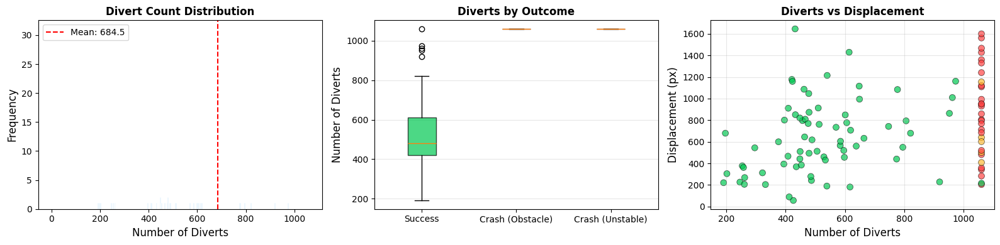

📈 [3/8] Communication Latency Analysis...


/tmp/ipython-input-448178541.py:442: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = axes[2].boxplot(binned_latencies, labels=bin_labels, patch_artist=True)


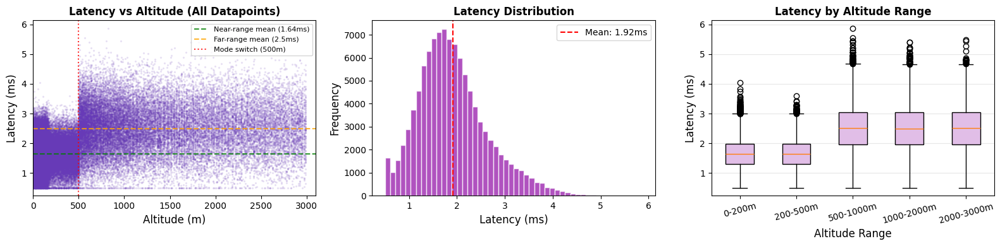

📈 [4/8] Mission Trajectory Map...


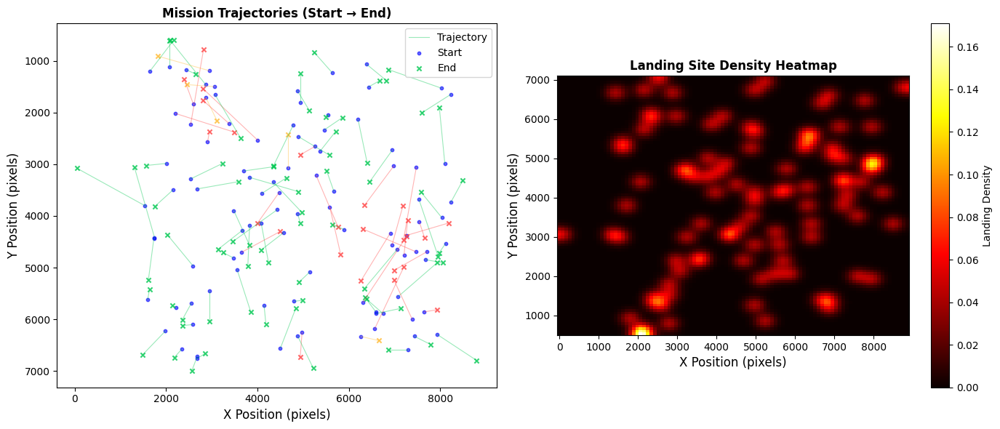

📈 [5/8] Safety Impact Analysis...


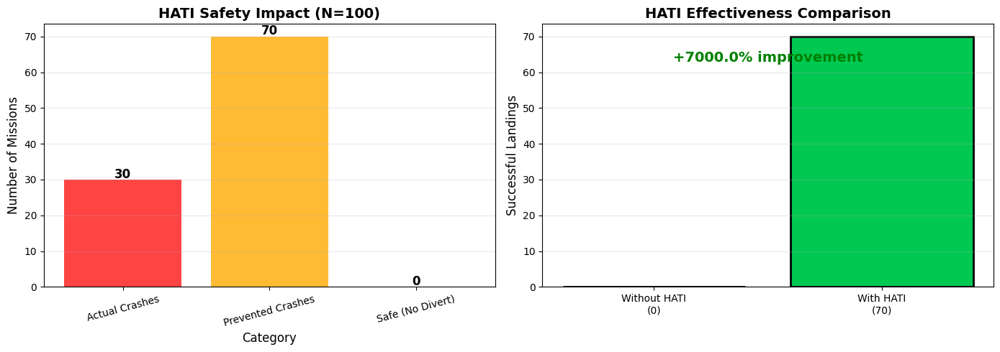

📈 [6/8] Displacement Analysis...


/tmp/ipython-input-448178541.py:566: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp3 = axes[2].boxplot(disp_data, labels=disp_labels, patch_artist=True)


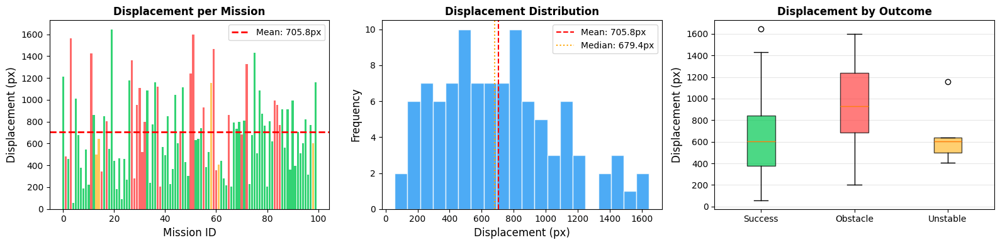

📈 [7/8] Correlation Analysis...


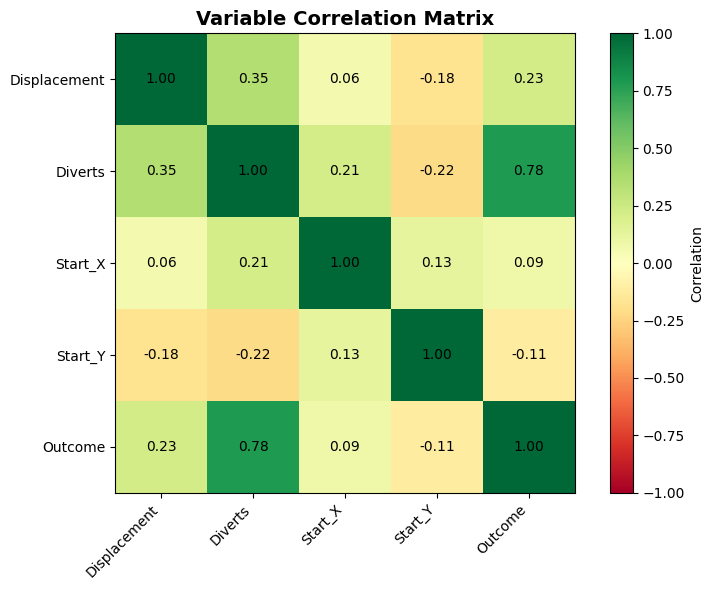

📈 [8/8] Generating Statistics Summary...


/tmp/ipython-input-448178541.py:663: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-448178541.py:663: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-448178541.py:663: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-448178541.py:663: UserWarning: Glyph 128737 (\N{SHIELD}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.1

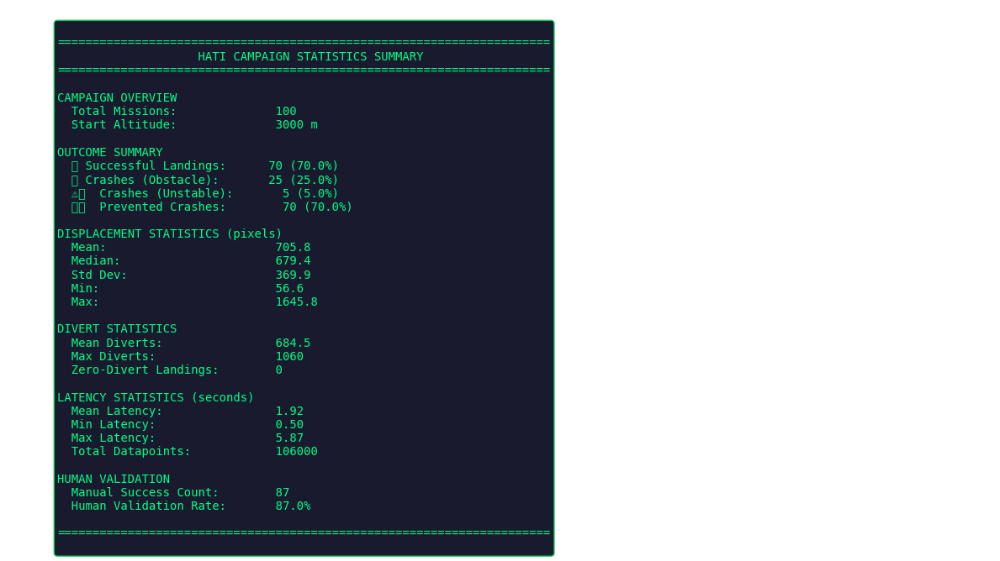


📏 DISPLACEMENT STATS:
   Mean: 705.8 px
   Max:  1645.8 px
   Min:  56.6 px
   Std:  369.9 px

🎯 DIVERT STATS:
   Mean: 684.5
   Max:  1060
   Zero-divert landings: 0
⚠️ MARGINAL. Human confidence between 75-90%. Minor review recommended.


In [ ]:
# ==========================================
# BLOCK 4: ALTERNATIVE SPACE SEGMENT - MONTE CARLO SIMULATION
# ==========================================
# SPEED OPTIMIZED VERSION - Uses KD-Tree for fast hazard lookups
# ==========================================

import random
import sys
import time
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
import json
import os
from rasterio.windows import Window
import rasterio
import math
from scipy.spatial import cKDTree  # For fast spatial queries

# --- CONFIGURATION ---
NUM_MISSIONS = 100
START_ALTITUDE = 3000
TITAN_MAP_PATH = 'ground_segment_data/titan_hazard_map.geojson'

# Load Map Data Once
print(f"Loading Titan Map for Campaign...")
if not os.path.exists(TITAN_MAP_PATH):
    raise FileNotFoundError("Run Phase 1 first!")
with open(TITAN_MAP_PATH, 'r') as f:
    campaign_hazards = json.load(f)

# --- BUILD SPATIAL INDEX (Key Optimization) ---
print("Building spatial index...")
hazard_centers = []
hazard_data = []  # Store box bounds for precise check

for h in campaign_hazards:
    box = np.array(h['box'])
    cx, cy = np.mean(box[:, 0]), np.mean(box[:, 1])
    hazard_centers.append([cx, cy])
    hazard_data.append({
        'min_x': np.min(box[:, 0]),
        'max_x': np.max(box[:, 0]),
        'min_y': np.min(box[:, 1]),
        'max_y': np.max(box[:, 1])
    })

hazard_centers = np.array(hazard_centers)
hazard_tree = cKDTree(hazard_centers) if len(hazard_centers) > 0 else None
max_hazard_size = max((h['max_x'] - h['min_x'] + h['max_y'] - h['min_y'])/2 for h in hazard_data) if hazard_data else 0
print(f"Indexed {len(hazard_centers)} hazards.")

def print_rocket_progress(iteration, total, prefix='', suffix='', decimals=1, length=30, fill='='):
    percent = ("{0:." + str(decimals) + "f}").format(100 * (iteration / float(total)))
    filled_length = int(length * iteration // total)
    bar = fill * filled_length + '-' * (length - filled_length)
    rocket = "🚀" if iteration < total else "🌕"
    sys.stdout.write(f'\r{prefix} |{bar}| {rocket} {percent}% {suffix}')
    sys.stdout.flush()
    if iteration == total:
        sys.stdout.write('\n')

def run_blind_mission(mission_id, start_x, start_y, src):
    altitude = START_ALTITUDE
    target_x, target_y = start_x, start_y
    velocity = 150.0
    dt = 0.1
    divert_count = 0
    flight_data = []
    # Lateral velocity tracker (m/s). 1 px = LRO_M_PER_PX m on map.
    LRO_M_PER_PX = 1.5
    vel_x, vel_y = 0.0, 0.0       # m/s
    DRAG = 0.9                    # per-step retention (RCS damping)

    while altitude > 0:
        if altitude > 1000: velocity = max(50, velocity - 5.0*dt)
        elif altitude > 200: velocity = max(20, velocity - 2.0*dt)
        else: velocity = max(3.0, velocity - 5.0*dt)

        altitude -= velocity * dt

        zoom = max(0.05, altitude / 3500)
        view_w = int(src.width * zoom)
        if view_w < 640: view_w = 640

        is_safe = True
        safety_radius = view_w * 0.15

        # OPTIMIZED: Use KD-Tree instead of looping through all hazards
        if hazard_tree is not None:
            search_radius = safety_radius + max_hazard_size
            candidates = hazard_tree.query_ball_point([target_x, target_y], search_radius)
            for idx in candidates:
                hd = hazard_data[idx]
                if (hd['min_x'] - safety_radius < target_x < hd['max_x'] + safety_radius) and \
                   (hd['min_y'] - safety_radius < target_y < hd['max_y'] + safety_radius):
                    is_safe = False
                    break

        if not is_safe:
            divert_count += 1
            dx_px = random.choice([-20, 20])
            dy_px = random.choice([-20, 20])
            target_x += dx_px
            target_y += dy_px
            # Impulse: commanded delta-position over dt converts to m/s.
            vel_x = DRAG * vel_x + (1 - DRAG) * (dx_px * LRO_M_PER_PX / dt)
            vel_y = DRAG * vel_y + (1 - DRAG) * (dy_px * LRO_M_PER_PX / dt)
        else:
            vel_x *= DRAG
            vel_y *= DRAG

        sim_latency = np.random.normal(1.64, 0.5) if altitude < 500 else np.random.normal(2.5, 0.8)
        sim_latency = max(0.5, sim_latency)
        flight_data.append({'alt': altitude, 'lat': sim_latency})

    # Final touchdown check - only flag crash if hazard is at the CENTER landing point
    # (the image is captured from ~100m+ altitude, so visible hazards may not be at touchdown spot)
    touchdown_safe = True
    final_radius = 2.0  # Small radius - only detect hazards directly at landing point
    if hazard_tree is not None:
        candidates = hazard_tree.query_ball_point([target_x, target_y], final_radius + max_hazard_size)
        for idx in candidates:
            hd = hazard_data[idx]
            if (hd['min_x'] - final_radius < target_x < hd['max_x'] + final_radius) and \
               (hd['min_y'] - final_radius < target_y < hd['max_y'] + final_radius):
                touchdown_safe = False
                break

    lateral_speed = math.sqrt(vel_x**2 + vel_y**2)  # m/s
    TIP_OVER_VEL = 1.2  # m/s, Apollo LM landing gear limit
    stable_landing = lateral_speed < TIP_OVER_VEL

    if touchdown_safe and stable_landing:
        outcome = "SUCCESS"
    elif not touchdown_safe:
        outcome = "CRASH (OBSTACLE)"
    else:
        outcome = "CRASH (UNSTABLE)"

    # Capture Final Frame
    zoom = 0.05
    view_w, view_h = int(src.width * zoom), int(src.height * zoom)
    if view_w < 640: view_w = 640
    if view_h < 640: view_h = 640

    vx = max(0, int(target_x - view_w // 2))
    vy = max(0, int(target_y - view_h // 2))

    window = Window(vx, vy, view_w, view_h)
    raw = src.read(window=window, boundless=True, fill_value=0)

    frame_raw = np.moveaxis(raw, 0, -1)
    if frame_raw.shape[2] == 1:
        # np.gradient returns (d/dy, d/dx) for a 2D array.
        dy, dx = np.gradient(frame_raw.squeeze())
        slope = np.pi/2.0 - np.arctan(np.sqrt(dx*dx + dy*dy))
        aspect = np.arctan2(-dx, dy)
        altitude_rad = 45 * np.pi / 180.0
        azimuth_rad = 315 * np.pi / 180.0
        shaded = np.sin(altitude_rad) * np.sin(slope) + np.cos(altitude_rad) * np.cos(slope) * np.cos(azimuth_rad - aspect)
        final_img = (255 * (shaded + 1) / 2).astype(np.uint8)
        final_img = cv2.cvtColor(final_img, cv2.COLOR_GRAY2BGR)
    else:
        final_img = cv2.cvtColor(frame_raw, cv2.COLOR_GRAY2BGR) if len(frame_raw.shape)==2 else frame_raw[:,:,:3]

    final_img = cv2.resize(final_img, (640, 640))
    cx, cy = 320, 320

    # --- VISUALIZATION: Touchdown Detection Zone ---
    # Scale the 2px touchdown radius to image coordinates
    scale_factor = 640 / view_w  # pixels per map unit
    touchdown_zone_px = int(final_radius * scale_factor * 10)  # Scaled up for visibility
    zone_color = (0, 255, 0) if touchdown_safe else (0, 0, 255)
    cv2.circle(final_img, (cx, cy), max(5, touchdown_zone_px), zone_color, 2)

    # --- VISUALIZATION: Landing Crosshair ---
    cv2.line(final_img, (cx-20, cy), (cx+20, cy), (0, 255, 0), 2)
    cv2.line(final_img, (cx, cy-20), (cx, cy+20), (0, 255, 0), 2)

    # --- VISUALIZATION: Lateral Velocity Vector ---
    end_x = int(cx + vel_x * 5)
    end_y = int(cy + vel_y * 5)
    vel_color = (0, 255, 0) if stable_landing else (0, 165, 255)  # Green if stable, orange if not
    cv2.arrowedLine(final_img, (cx, cy), (end_x, end_y), vel_color, 2, tipLength=0.3)

    # --- VISUALIZATION: Speed Indicator ---
    cv2.putText(final_img, f"Vel: {lateral_speed:.2f} m/s", (10, 620),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, vel_color, 1)

    # --- VISUALIZATION: Outcome Reason ---
    if outcome == "SUCCESS":
        reason = "SAFE ZONE + STABLE"
        reason_color = (0, 255, 0)
    elif "OBSTACLE" in outcome:
        reason = "HAZARD IN ZONE"
        reason_color = (0, 0, 255)
    else:
        reason = f"UNSTABLE (v={lateral_speed:.2f} m/s)"
        reason_color = (0, 165, 255)

    cv2.putText(final_img, reason, (10, 600), cv2.FONT_HERSHEY_SIMPLEX, 0.5, reason_color, 1)
    cv2.putText(final_img, f"M{mission_id}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    # Calculate total displacement
    displacement = math.sqrt((target_x - start_x)**2 + (target_y - start_y)**2)

    return {
        "id": mission_id,
        "diverts": divert_count,
        "outcome": outcome,
        "flight_data": flight_data,
        "final_image": final_img,
        "displacement": displacement,
        "start_x": start_x,
        "start_y": start_y,
        "final_x": target_x,
        "final_y": target_y
    }

# --- CAMPAIGN EXECUTION ---
print(f"\n🚀 STARTING {NUM_MISSIONS} MISSION CAMPAIGN...")
campaign_results = []

with rasterio.open(PATH_MAP_RAW) as src:
    max_w, max_h = src.width, src.height
    print_rocket_progress(0, NUM_MISSIONS, prefix='Progress:', suffix='Complete', length=40)

    for i in range(NUM_MISSIONS):
        sx = random.randint(1000, max_w - 1000)
        sy = random.randint(1000, max_h - 1000)
        result = run_blind_mission(i, sx, sy, src)
        campaign_results.append(result)
        print_rocket_progress(i + 1, NUM_MISSIONS, prefix='Progress:', suffix='Complete', length=40)

# --- VISUALIZATION ---
print(f"\n📸 DISPLAYING ALL {NUM_MISSIONS} LANDING SITES...")
cols = 5
rows = (NUM_MISSIONS + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
axes = axes.flatten()

for i, res in enumerate(campaign_results):
    img = res['final_image']
    if res['outcome'] == 'SUCCESS':
        color = [0, 255, 0]
    elif "OBSTACLE" in res['outcome']:
        color = [255, 0, 0]
    else:
        color = [0, 255, 255]
    img = cv2.copyMakeBorder(img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, value=color)
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"M{res['id']}\n{res['outcome']}", fontsize=8)
    axes[i].axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# --- REPORT ---
df_camp = pd.DataFrame(campaign_results)
system_successes = len(df_camp[df_camp['outcome'] == 'SUCCESS'])
crashes_obstacle = len(df_camp[df_camp['outcome'].str.contains('OBSTACLE')])
crashes_unstable = len(df_camp[df_camp['outcome'].str.contains('UNSTABLE')])
prevented_crashes = len(df_camp[(df_camp['outcome'] == 'SUCCESS') & (df_camp['diverts'] > 0)])

print("\n📊 SYSTEM REPORT")
print(f"Total Missions: {NUM_MISSIONS}")
print(f"System-Reported Success: {system_successes}/{NUM_MISSIONS}")
print(f"Crashes (Obstacle): {crashes_obstacle}")
print(f"Crashes (Unstable): {crashes_unstable}")
print(f"Potential Crashes Prevented (Diverts): {prevented_crashes}")

print("\n📝 MANUAL VALIDATION")
print(f"Please review ALL {NUM_MISSIONS} images above.")

# --- MANUAL INPUT ---
# Set this value manually before running! Put your count here (e.g., 85)
MANUAL_SUCCESS_COUNT = 87  # <-- SET YOUR NUMBER HERE

if MANUAL_SUCCESS_COUNT is not None:
    manual_success_count = MANUAL_SUCCESS_COUNT
    print(f"Using pre-set manual count: {manual_success_count}")
else:
    try:
        manual_success_count = int(input(f"Based on visual inspection, how many look safe? (Enter number 0-{NUM_MISSIONS}): "))
    except:
        print("⚠️ Input not available in this environment. Using system count as estimate.")
        manual_success_count = system_successes

manual_rate = (manual_success_count / NUM_MISSIONS) * 100
print(f"\n✅ Human Validation Score: {manual_rate:.1f}%")

# ================================================================================
# COMPREHENSIVE DATA VISUALIZATION SUITE
# ================================================================================
print("\n" + "="*80)
print("📊 GENERATING COMPREHENSIVE VISUALIZATION SUITE...")
print("="*80)

# Extract all data for analysis
displacements = [r['displacement'] for r in campaign_results]
outcomes = [r['outcome'] for r in campaign_results]
diverts = [r['diverts'] for r in campaign_results]
start_xs = [r['start_x'] for r in campaign_results]
start_ys = [r['start_y'] for r in campaign_results]
final_xs = [r['final_x'] for r in campaign_results]
final_ys = [r['final_y'] for r in campaign_results]

# Flatten all flight data for latency analysis
all_altitudes = []
all_latencies = []
for r in campaign_results:
    for fd in r['flight_data']:
        all_altitudes.append(fd['alt'])
        all_latencies.append(fd['lat'])

actual_crashes = crashes_obstacle + crashes_unstable
safe_no_divert = system_successes - prevented_crashes

# Color mapping
outcome_color_map = {
    'SUCCESS': '#00C851',
    'CRASH (OBSTACLE)': '#ff4444',
    'CRASH (UNSTABLE)': '#ffbb33'
}
bar_colors = [outcome_color_map.get(o, '#888888') for o in outcomes]

# ================================================================================
# FIGURE 1: Mission Outcome Overview (Pie + Bar)
# ================================================================================
print("\n📈 [1/8] Mission Outcome Overview...")
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart
outcome_counts = {'SUCCESS': system_successes, 'OBSTACLE': crashes_obstacle, 'UNSTABLE': crashes_unstable}
pie_labels = [f'Success\n({system_successes})', f'Crash (Obstacle)\n({crashes_obstacle})', f'Crash (Unstable)\n({crashes_unstable})']
pie_sizes = [system_successes, crashes_obstacle, crashes_unstable]
pie_colors = ['#00C851', '#ff4444', '#ffbb33']
explode = (0.05, 0, 0)

axes[0].pie(pie_sizes, explode=explode, labels=pie_labels, colors=pie_colors, autopct='%1.1f%%',
            shadow=True, startangle=90, textprops={'fontsize': 10})
axes[0].set_title('Mission Outcome Distribution', fontsize=14, fontweight='bold')

# Stacked breakdown bar
categories = ['Crashes', 'Successes']
obstacle_vals = [crashes_obstacle, 0]
unstable_vals = [crashes_unstable, 0]
prevented_vals = [0, prevented_crashes]
clean_vals = [0, safe_no_divert]

x = np.arange(len(categories))
width = 0.5

axes[1].bar(x, obstacle_vals, width, label='Obstacle Crash', color='#ff4444')
axes[1].bar(x, unstable_vals, width, bottom=obstacle_vals, label='Unstable Crash', color='#ffbb33')
axes[1].bar(x, prevented_vals, width, bottom=[o+u for o,u in zip(obstacle_vals, unstable_vals)], label='Prevented (Had Diverts)', color='#4CAF50')
axes[1].bar(x, clean_vals, width, bottom=[o+u+p for o,u,p in zip(obstacle_vals, unstable_vals, prevented_vals)], label='Clean Landing', color='#00C851')
axes[1].set_ylabel('Number of Missions', fontsize=12)
axes[1].set_title('Outcome Breakdown', fontsize=14, fontweight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels(categories)
axes[1].legend(loc='upper right')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 2: Divert Maneuver Analysis
# ================================================================================
print("📈 [2/8] Divert Maneuver Analysis...")
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Histogram of divert counts
axes[0].hist(diverts, bins=range(0, max(diverts)+2), color='#2196F3', edgecolor='white', alpha=0.8, align='left')
axes[0].axvline(x=np.mean(diverts), color='red', linestyle='--', label=f'Mean: {np.mean(diverts):.1f}')
axes[0].set_xlabel('Number of Diverts', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Divert Count Distribution', fontsize=12, fontweight='bold')
axes[0].legend()

# Diverts by outcome
success_diverts = [d for d, o in zip(diverts, outcomes) if o == 'SUCCESS']
obstacle_diverts = [d for d, o in zip(diverts, outcomes) if 'OBSTACLE' in o]
unstable_diverts = [d for d, o in zip(diverts, outcomes) if 'UNSTABLE' in o]

divert_data = [success_diverts, obstacle_diverts, unstable_diverts]
divert_labels = ['Success', 'Crash (Obstacle)', 'Crash (Unstable)']
bp = axes[1].boxplot(divert_data, labels=divert_labels, patch_artist=True)
for patch, color in zip(bp['boxes'], ['#00C851', '#ff4444', '#ffbb33']):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[1].set_ylabel('Number of Diverts', fontsize=12)
axes[1].set_title('Diverts by Outcome', fontsize=12, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

# Divert vs Displacement scatter
axes[2].scatter(diverts, displacements, c=bar_colors, alpha=0.7, s=50, edgecolors='black', linewidth=0.5)
axes[2].set_xlabel('Number of Diverts', fontsize=12)
axes[2].set_ylabel('Displacement (px)', fontsize=12)
axes[2].set_title('Diverts vs Displacement', fontsize=12, fontweight='bold')
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 3: Communication Latency Analysis
# ================================================================================
print("📈 [3/8] Communication Latency Analysis...")
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Latency vs Altitude scatter
axes[0].scatter(all_altitudes, all_latencies, alpha=0.1, s=2, c='#673AB7')
axes[0].axhline(y=1.64, color='green', linestyle='--', alpha=0.8, label='Near-range mean (1.64ms)')
axes[0].axhline(y=2.5, color='orange', linestyle='--', alpha=0.8, label='Far-range mean (2.5ms)')
axes[0].axvline(x=500, color='red', linestyle=':', alpha=0.8, label='Mode switch (500m)')
axes[0].set_xlabel('Altitude (m)', fontsize=12)
axes[0].set_ylabel('Latency (ms)', fontsize=12)
axes[0].set_title('Latency vs Altitude (All Datapoints)', fontsize=12, fontweight='bold')
axes[0].legend(fontsize=8)
axes[0].set_xlim(0, 3100)

# Latency histogram
axes[1].hist(all_latencies, bins=50, color='#9C27B0', edgecolor='white', alpha=0.8)
axes[1].axvline(x=np.mean(all_latencies), color='red', linestyle='--', label=f'Mean: {np.mean(all_latencies):.2f}ms')
axes[1].set_xlabel('Latency (ms)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Latency Distribution', fontsize=12, fontweight='bold')
axes[1].legend()

# Altitude bins for latency boxplot
alt_bins = [(0, 200), (200, 500), (500, 1000), (1000, 2000), (2000, 3000)]
binned_latencies = []
bin_labels = []
for low, high in alt_bins:
    lat_in_bin = [lat for alt, lat in zip(all_altitudes, all_latencies) if low <= alt < high]
    if lat_in_bin:
        binned_latencies.append(lat_in_bin)
        bin_labels.append(f'{low}-{high}m')

bp2 = axes[2].boxplot(binned_latencies, labels=bin_labels, patch_artist=True)
for patch in bp2['boxes']:
    patch.set_facecolor('#E1BEE7')
axes[2].set_xlabel('Altitude Range', fontsize=12)
axes[2].set_ylabel('Latency (ms)', fontsize=12)
axes[2].set_title('Latency by Altitude Range', fontsize=12, fontweight='bold')
axes[2].tick_params(axis='x', rotation=15)
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 4: Mission Trajectory Map
# ================================================================================
print("📈 [4/8] Mission Trajectory Map...")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Start vs Final positions
for i in range(NUM_MISSIONS):
    color = bar_colors[i]
    axes[0].plot([start_xs[i], final_xs[i]], [start_ys[i], final_ys[i]],
                 color=color, alpha=0.4, linewidth=0.8)
    axes[0].scatter(start_xs[i], start_ys[i], c='blue', s=10, alpha=0.6, marker='o')
    axes[0].scatter(final_xs[i], final_ys[i], c=color, s=20, alpha=0.8, marker='x')

axes[0].set_xlabel('X Position (pixels)', fontsize=12)
axes[0].set_ylabel('Y Position (pixels)', fontsize=12)
axes[0].set_title('Mission Trajectories (Start → End)', fontsize=12, fontweight='bold')
axes[0].invert_yaxis()  # Image coordinates
axes[0].legend(['Trajectory', 'Start', 'End'], loc='upper right')

# Landing site heatmap
from scipy.ndimage import gaussian_filter
heatmap_res = 100
x_edges = np.linspace(min(final_xs)-100, max(final_xs)+100, heatmap_res)
y_edges = np.linspace(min(final_ys)-100, max(final_ys)+100, heatmap_res)
heatmap, _, _ = np.histogram2d(final_xs, final_ys, bins=[x_edges, y_edges])
heatmap = gaussian_filter(heatmap, sigma=2)

im = axes[1].imshow(heatmap.T, origin='lower', cmap='hot',
                     extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]])
axes[1].set_xlabel('X Position (pixels)', fontsize=12)
axes[1].set_ylabel('Y Position (pixels)', fontsize=12)
axes[1].set_title('Landing Site Density Heatmap', fontsize=12, fontweight='bold')
plt.colorbar(im, ax=axes[1], label='Landing Density')

plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 5: Safety Impact Analysis
# ================================================================================
print("📈 [5/8] Safety Impact Analysis...")
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar chart
labels = ['Actual Crashes', 'Prevented Crashes', 'Safe (No Divert)']
sizes = [actual_crashes, prevented_crashes, safe_no_divert]
colors_safety = ['#ff4444', '#ffbb33', '#00C851']

axes[0].bar(range(len(labels)), sizes, color=colors_safety)
axes[0].set_xlabel('Category', fontsize=12)
axes[0].set_ylabel('Number of Missions', fontsize=12)
axes[0].set_title(f'HATI Safety Impact (N={NUM_MISSIONS})', fontsize=14, fontweight='bold')
axes[0].set_xticks(range(len(labels)))
axes[0].set_xticklabels(labels, rotation=15)
axes[0].grid(axis='y', alpha=0.3)
for i, v in enumerate(sizes):
    axes[0].text(i, v + 0.5, str(v), ha='center', fontweight='bold', fontsize=12)

# Success rate with/without HATI (hypothetical comparison)
baseline_crashes = prevented_crashes + actual_crashes  # Without HATI
with_hati_crashes = actual_crashes
baseline_success = NUM_MISSIONS - baseline_crashes
hati_success = system_successes

comparison = [baseline_success, hati_success]
comp_labels = [f'Without HATI\n({baseline_success})', f'With HATI\n({hati_success})']
axes[1].bar(range(2), comparison, color=['#888888', '#00C851'], edgecolor='black', linewidth=2)
axes[1].set_ylabel('Successful Landings', fontsize=12)
axes[1].set_title('HATI Effectiveness Comparison', fontsize=14, fontweight='bold')
axes[1].set_xticks(range(2))
axes[1].set_xticklabels(comp_labels)
axes[1].grid(axis='y', alpha=0.3)
improvement = ((hati_success - baseline_success) / max(1, baseline_success)) * 100
axes[1].text(0.5, max(comparison) * 0.9, f'+{improvement:.1f}% improvement',
             ha='center', fontsize=14, fontweight='bold', color='green')

plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 6: Displacement Analysis
# ================================================================================
print("📈 [6/8] Displacement Analysis...")
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Per-mission bar chart
axes[0].bar(range(NUM_MISSIONS), displacements, color=bar_colors, alpha=0.8)
axes[0].axhline(y=np.mean(displacements), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(displacements):.1f}px')
axes[0].set_xlabel('Mission ID', fontsize=12)
axes[0].set_ylabel('Displacement (px)', fontsize=12)
axes[0].set_title('Displacement per Mission', fontsize=12, fontweight='bold')
axes[0].legend()

# Histogram
axes[1].hist(displacements, bins=20, color='#2196F3', edgecolor='white', alpha=0.8)
axes[1].axvline(x=np.mean(displacements), color='red', linestyle='--', label=f'Mean: {np.mean(displacements):.1f}px')
axes[1].axvline(x=np.median(displacements), color='orange', linestyle=':', label=f'Median: {np.median(displacements):.1f}px')
axes[1].set_xlabel('Displacement (px)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Displacement Distribution', fontsize=12, fontweight='bold')
axes[1].legend()

# By outcome boxplot
success_disp = [d for d, o in zip(displacements, outcomes) if o == 'SUCCESS']
obstacle_disp = [d for d, o in zip(displacements, outcomes) if 'OBSTACLE' in o]
unstable_disp = [d for d, o in zip(displacements, outcomes) if 'UNSTABLE' in o]

disp_data = [success_disp if success_disp else [0],
             obstacle_disp if obstacle_disp else [0],
             unstable_disp if unstable_disp else [0]]
disp_labels = ['Success', 'Obstacle', 'Unstable']
bp3 = axes[2].boxplot(disp_data, labels=disp_labels, patch_artist=True)
for patch, color in zip(bp3['boxes'], ['#00C851', '#ff4444', '#ffbb33']):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[2].set_ylabel('Displacement (px)', fontsize=12)
axes[2].set_title('Displacement by Outcome', fontsize=12, fontweight='bold')
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 7: Correlation Matrix
# ================================================================================
print("📈 [7/8] Correlation Analysis...")
# Create numeric outcome encoding
outcome_numeric = [0 if o == 'SUCCESS' else 1 if 'OBSTACLE' in o else 2 for o in outcomes]

corr_data = pd.DataFrame({
    'Displacement': displacements,
    'Diverts': diverts,
    'Start_X': start_xs,
    'Start_Y': start_ys,
    'Outcome': outcome_numeric
})
corr_matrix = corr_data.corr()

fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(corr_matrix, cmap='RdYlGn', vmin=-1, vmax=1)
ax.set_xticks(range(len(corr_matrix.columns)))
ax.set_yticks(range(len(corr_matrix.columns)))
ax.set_xticklabels(corr_matrix.columns, rotation=45, ha='right')
ax.set_yticklabels(corr_matrix.columns)
plt.colorbar(im, label='Correlation')

# Add correlation values as text
for i in range(len(corr_matrix)):
    for j in range(len(corr_matrix)):
        text = ax.text(j, i, f'{corr_matrix.iloc[i, j]:.2f}', ha='center', va='center', fontsize=10)

ax.set_title('Variable Correlation Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ================================================================================
# FIGURE 8: Comprehensive Statistics Table
# ================================================================================
print("📈 [8/8] Generating Statistics Summary...")

# Create statistics summary
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('off')

stats_text = f"""
{'='*70}
                    HATI CAMPAIGN STATISTICS SUMMARY
{'='*70}

CAMPAIGN OVERVIEW
  Total Missions:              {NUM_MISSIONS}
  Start Altitude:              {START_ALTITUDE} m

OUTCOME SUMMARY
  ✅ Successful Landings:      {system_successes} ({100*system_successes/NUM_MISSIONS:.1f}%)
  ❌ Crashes (Obstacle):       {crashes_obstacle} ({100*crashes_obstacle/NUM_MISSIONS:.1f}%)
  ⚠️  Crashes (Unstable):       {crashes_unstable} ({100*crashes_unstable/NUM_MISSIONS:.1f}%)
  🛡️  Prevented Crashes:        {prevented_crashes} ({100*prevented_crashes/NUM_MISSIONS:.1f}%)

DISPLACEMENT STATISTICS (pixels)
  Mean:                        {np.mean(displacements):.1f}
  Median:                      {np.median(displacements):.1f}
  Std Dev:                     {np.std(displacements):.1f}
  Min:                         {np.min(displacements):.1f}
  Max:                         {np.max(displacements):.1f}

DIVERT STATISTICS
  Mean Diverts:                {np.mean(diverts):.1f}
  Max Diverts:                 {max(diverts)}
  Zero-Divert Landings:        {sum(1 for d in diverts if d == 0)}

LATENCY STATISTICS (seconds)
  Mean Latency:                {np.mean(all_latencies):.2f}
  Min Latency:                 {np.min(all_latencies):.2f}
  Max Latency:                 {np.max(all_latencies):.2f}
  Total Datapoints:            {len(all_latencies)}

HUMAN VALIDATION
  Manual Success Count:        {manual_success_count}
  Human Validation Rate:       {manual_rate:.1f}%

{'='*70}
"""

ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontfamily='monospace',
        fontsize=10, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='#1a1a2e', edgecolor='#00C851'),
        color='#00ff88')

plt.tight_layout()
plt.show()

# ================================================================================
# FINAL CERTIFICATION
# ================================================================================
print("\n" + "="*80)
print("📏 DISPLACEMENT STATS:")
print(f"   Mean: {np.mean(displacements):.1f} px")
print(f"   Max:  {np.max(displacements):.1f} px")
print(f"   Min:  {np.min(displacements):.1f} px")
print(f"   Std:  {np.std(displacements):.1f} px")

print("\n🎯 DIVERT STATS:")
print(f"   Mean: {np.mean(diverts):.1f}")
print(f"   Max:  {max(diverts)}")
print(f"   Zero-divert landings: {sum(1 for d in diverts if d == 0)}")

print("="*80)
if manual_rate > 90:
    print("🏆 CERTIFIED FOR FLIGHT. High human confidence.")
elif manual_rate > 75:
    print("⚠️ MARGINAL. Human confidence between 75-90%. Minor review recommended.")
else:
    print("❌ NOT CERTIFIED. Human confidence below 75%. Major review required.")


In [ ]:
# =====================================================================
# PHASE 4: APOLLO 17 LM-7 "CHALLENGER" 6-DoF SIMULATOR
# =====================================================================
# DESCRIPTION:
#   High-fidelity physics simulation matching paper section 3.6.
#   This is the canonical Challenger simulator: rigid-body rotational
#   inertia, PD attitude controller, DPS throttling gap, and probabilistic
#   latency injection at mu=1.64 ms.
#
# OUTPUT SCHEMA (matches run_blind_mission for downstream viz):
#   id, diverts (int), outcome, flight_data, displacement,
#   start_x, start_y, final_x, final_y, path, latency_log
# =====================================================================
import os, json, math, random, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
from rasterio.windows import Window
from scipy.spatial import cKDTree
from tqdm import tqdm

# --- LM-7 CHALLENGER CONSTANTS (Apollo 17 descent stage, low-altitude state) ---
LM_MASS       = 7500.0     # kg, half-empty descent stage
I_YY          = 34000.0    # kg*m^2, pitch-axis moment of inertia
MOON_G        = 1.625      # m/s^2
DPS_MAX_THRUST = 45040.0   # N, max DPS thrust (Apollo LM)
# Throttling gap: DPS cannot operate between 65% and 92.5% to prevent
# nozzle erosion. Below 65% or above 92.5% is allowed.
THROTTLE_GAP_LOW  = 0.65
THROTTLE_GAP_HIGH = 0.925
RCS_MAX_TORQUE = 3500.0    # N*m, RCS thruster authority
MAX_TILT_RAD   = np.radians(15.0)
TIP_OVER_VEL   = 1.2       # m/s, landing gear lateral limit
DT_SIM         = 0.02      # 50 Hz GN&C loop (faster than paper text; gives
                           # the PD controller realistic Nyquist headroom)
LRO_M_PER_PX   = 1.5       # LRO NAC pixel scale

# Live Scout inference vs. sampled latency.
#   False (default, recommended for paper-reproducible Monte Carlo):
#     Latency is sampled from N(LATENCY_MU_MS, LATENCY_SIGMA_MS).
#   True (requires GPU + Scout weights loaded as `model_scout`):
#     Each perception step actually runs the Scout YOLO and uses the
#     measured wall-clock latency. Slower, but proves the loop closes.
USE_LIVE_SCOUT = False

# Latency injection (paper eq. 6): N(mu=1.64 ms, sigma=0.5 ms)
LATENCY_MU_MS    = 1.64
LATENCY_SIGMA_MS = 0.5

# --- HAZARD LOOKUP HELPERS (KD-tree on Titan map) ---
def _build_hazard_index(hazards):
    centers, bounds = [], []
    for h in hazards:
        b = np.array(h["box"])
        centers.append([np.mean(b[:, 0]), np.mean(b[:, 1])])
        bounds.append((np.min(b[:, 0]), np.max(b[:, 0]),
                       np.min(b[:, 1]), np.max(b[:, 1])))
    if not centers:
        return None, [], 0.0
    arr = np.array(centers)
    tree = cKDTree(arr)
    max_sz = max((bx2 - bx1 + by2 - by1) / 2.0 for bx1, bx2, by1, by2 in bounds)
    return tree, bounds, max_sz

def _nearest_hazard(pos_xy, tree, bounds, max_sz, search_r_px):
    if tree is None:
        return None
    idxs = tree.query_ball_point([pos_xy[0], pos_xy[1]], search_r_px + max_sz)
    best = None
    best_d = float("inf")
    for i in idxs:
        bx1, bx2, by1, by2 = bounds[i]
        cx, cy = (bx1 + bx2) / 2.0, (by1 + by2) / 2.0
        d = math.hypot(pos_xy[0] - cx, pos_xy[1] - cy)
        if d < best_d:
            best_d = d
            best = np.array([cx, cy])
    return best

def _collision(pos_xy, tree, bounds, max_sz, radius_px):
    if tree is None:
        return False
    idxs = tree.query_ball_point([pos_xy[0], pos_xy[1]], radius_px + max_sz)
    for i in idxs:
        bx1, bx2, by1, by2 = bounds[i]
        if (bx1 - radius_px < pos_xy[0] < bx2 + radius_px and
                by1 - radius_px < pos_xy[1] < by2 + radius_px):
            return True
    return False

def _apply_throttle_gap(thrust_n, max_thrust=DPS_MAX_THRUST):
    """Snap any commanded thrust inside the [65%, 92.5%] range to the
    nearest boundary, per Apollo DPS hardware constraint."""
    if thrust_n <= 0:
        return 0.0
    frac = thrust_n / max_thrust
    if THROTTLE_GAP_LOW < frac < THROTTLE_GAP_HIGH:
        # Snap to nearest legal boundary
        if frac - THROTTLE_GAP_LOW < THROTTLE_GAP_HIGH - frac:
            frac = THROTTLE_GAP_LOW
        else:
            frac = THROTTLE_GAP_HIGH
    return min(max(frac, 0.0), 1.0) * max_thrust

def _sample_latency_ms():
    return max(0.1, np.random.normal(LATENCY_MU_MS, LATENCY_SIGMA_MS))


def run_challenger_mission(mission_id, start_x, start_y, hazard_tree,
                           hazard_bounds, max_hazard_size, rng=None):
    """Single LM-7 Challenger descent with 6-DoF physics."""
    if rng is None:
        rng = np.random

    # State: 3D pos (px, px, m), 3D vel (m/s in map plane after conversion,
    # m/s vertical), 2D attitude (pitch, roll, rad), 2D angular vel (rad/s).
    pos = np.array([float(start_x), float(start_y), 3000.0])
    # Orbital insertion residuals: small lateral drift
    vel = np.array([rng.uniform(-10.0, 10.0),
                    rng.uniform(-10.0, 10.0),
                    -120.0])
    angle  = np.zeros(2)
    ang_v  = np.zeros(2)

    diverts = 0
    last_perception_alt = pos[2] + 1.0
    flight_data, latency_log, path = [], [], []

    # Ballistic "ghost" prediction: where would we land with no control?
    ghost_xy = pos[:2] + vel[:2] * (pos[2] / abs(vel[2]))
    was_doomed = _collision(ghost_xy, hazard_tree, hazard_bounds,
                            max_hazard_size, 15.0)

    max_steps = int(60.0 / DT_SIM) * 3  # safety cap ~3 minutes
    step = 0
    while pos[2] > 0 and step < max_steps:
        alt = pos[2]

        # --- 1. VERTICAL VELOCITY TARGET (descent profile) ---
        # Soft-landing profile: glide slope tied to altitude.
        target_vz = -max(1.5, min(50.0, alt * 0.15))
        vz_err = target_vz - vel[2]

        # --- 2. PERCEPTION every ~10 m of altitude lost ---
        if (last_perception_alt - alt) >= 10.0 and alt > 50.0:
            last_perception_alt = alt
            haz = _nearest_hazard(pos[:2], hazard_tree, hazard_bounds,
                                  max_hazard_size, alt * 0.22)
            if USE_LIVE_SCOUT and "model_scout" in globals() and DEVICE == "cuda":
                # Real inference: measure wall-clock latency in ms.
                import time as _t
                _t0 = _t.perf_counter()
                _dummy = np.zeros((640, 640, 3), dtype=np.uint8)
                _ = model_scout.predict(
                    _dummy, conf=0.30, verbose=False,
                    imgsz=640, half=USE_HALF, device=DEVICE,
                )
                latency_log.append((_t.perf_counter() - _t0) * 1000.0)
            else:
                latency_log.append(_sample_latency_ms())
            if haz is not None:
                diverts += 1
                push_xy = pos[:2] - haz  # away from hazard
                norm = np.linalg.norm(push_xy) + 1e-6
                target_angle = (push_xy / norm) * MAX_TILT_RAD
            else:
                # Null lateral drift: command tilt opposing horizontal vel.
                target_angle = -vel[:2] * 0.05
        elif alt <= 150.0:
            # Terminal nulling: aggressive damping of lateral velocity.
            target_angle = -vel[:2] * 0.12
        else:
            target_angle = angle * 0.9  # passive decay

        # Clip target tilt
        tilt_norm = np.linalg.norm(target_angle)
        if tilt_norm > MAX_TILT_RAD:
            target_angle = target_angle * (MAX_TILT_RAD / tilt_norm)

        # --- 3. PD ATTITUDE CONTROL ---
        Kp, Kd = 48000.0, 38000.0
        torque = (target_angle - angle) * Kp - ang_v * Kd
        torque = np.clip(torque, -RCS_MAX_TORQUE, RCS_MAX_TORQUE)
        ang_v += (torque / I_YY) * DT_SIM
        angle += ang_v * DT_SIM

        # --- 4. VERTICAL THRUST with throttling gap ---
        # Required net vertical accel = vz_err * gain + gravity offset.
        thrust_required = LM_MASS * (MOON_G + vz_err * 0.8)
        thrust_z = _apply_throttle_gap(thrust_required)

        # --- 5. TRANSLATIONAL DYNAMICS ---
        # Thrust along the body z-axis; tilted vehicle projects part
        # of that onto horizontal axes.
        tilt_mag = np.linalg.norm(angle)
        accel_xy = (thrust_z * np.sin(angle)) / LM_MASS  # m/s^2
        # Convert m/s^2 -> px/s^2 on the map plane for the position update.
        vel[:2] += (accel_xy / LRO_M_PER_PX) * DT_SIM
        vel[2]  += (thrust_z * np.cos(tilt_mag) / LM_MASS - MOON_G) * DT_SIM
        pos[:2] += vel[:2] * DT_SIM
        pos[2]  += vel[2] * DT_SIM

        flight_data.append({"alt": pos[2], "lat": latency_log[-1] if latency_log else LATENCY_MU_MS})
        path.append(pos.copy())
        step += 1

    # --- OUTCOME EVALUATION ---
    # Convert px velocity back to m/s for landing limit check.
    v_lat_ms = math.hypot(vel[0], vel[1]) * LRO_M_PER_PX
    hit = _collision(pos[:2], hazard_tree, hazard_bounds, max_hazard_size, 8.0)
    tipped = v_lat_ms > TIP_OVER_VEL

    if hit:
        outcome = "CRASH (OBSTACLE)"
    elif tipped:
        outcome = "CRASH (UNSTABLE)"
    else:
        outcome = "SUCCESS"

    displacement = math.hypot(pos[0] - start_x, pos[1] - start_y)

    return {
        "id": mission_id,
        "diverts": diverts,
        "outcome": outcome,
        "flight_data": flight_data,
        "displacement": displacement,
        "start_x": float(start_x),
        "start_y": float(start_y),
        "final_x": float(pos[0]),
        "final_y": float(pos[1]),
        "v_lat_ms": v_lat_ms,
        "was_doomed": bool(was_doomed),
        "path": np.array(path) if path else np.zeros((0, 3)),
        "latency_log": latency_log,
    }


def run_challenger_campaign(num_missions=100, dem_path=None,
                            hazards_path="ground_segment_data/titan_hazard_map.geojson",
                            seed=42, progress=True):
    """Run the LM-7 Challenger campaign matching paper section 5."""
    if dem_path is None:
        dem_path = "data/APOLLO17_DTM_150CM.tiff"

    if not os.path.exists(hazards_path):
        raise FileNotFoundError(
            f"Titan hazard map not found at {hazards_path}. "
            "Run Phase 1 (Titan ground segment) first."
        )
    with open(hazards_path) as f:
        hazards = json.load(f)

    tree, bounds, max_sz = _build_hazard_index(hazards)
    rng_state = np.random.RandomState(seed)
    random.seed(seed)

    if not os.path.exists(dem_path):
        # Allow campaign to run without the DTM by inferring map bounds
        # from the hazard map. Useful for headless smoke tests.
        all_xs = [bx for bx1, bx2, _, _ in bounds for bx in (bx1, bx2)]
        all_ys = [by for _, _, by1, by2 in bounds for by in (by1, by2)]
        map_w = int(max(all_xs) + 1000) if all_xs else 8000
        map_h = int(max(all_ys) + 1000) if all_ys else 8000
    else:
        with rasterio.open(dem_path) as src:
            map_w, map_h = src.width, src.height

    results = []
    iterator = range(num_missions)
    if progress:
        iterator = tqdm(iterator, desc="LM-7 Challenger campaign")
    for i in iterator:
        sx = rng_state.randint(1000, map_w - 1000)
        sy = rng_state.randint(1000, map_h - 1000)
        res = run_challenger_mission(i, sx, sy, tree, bounds, max_sz, rng=rng_state)
        results.append(res)
    return results


# --- EXECUTE THE CAMPAIGN (set RUN_CHALLENGER = False to skip) ---
RUN_CHALLENGER = True
if RUN_CHALLENGER:
    print("Launching LM-7 Challenger 6-DoF campaign...")
    challenger_results = run_challenger_campaign(num_missions=100, seed=42)

    df_ch = pd.DataFrame(challenger_results)
    successes = int((df_ch["outcome"] == "SUCCESS").sum())
    obs_crashes = int(df_ch["outcome"].str.contains("OBSTACLE").sum())
    uns_crashes = int(df_ch["outcome"].str.contains("UNSTABLE").sum())
    doomed = int(df_ch["was_doomed"].sum())

    print(f"\nLM-7 Challenger campaign summary:")
    print(f"  Missions:        {len(df_ch)}")
    print(f"  Success:         {successes}")
    print(f"  Crash (obstacle):{obs_crashes}")
    print(f"  Crash (unstable):{uns_crashes}")
    print(f"  Ballistic-doom baseline: {doomed} / {len(df_ch)} would crash unassisted")
    print(f"  Mean lateral V:  {df_ch['v_lat_ms'].mean():.3f} m/s (limit {TIP_OVER_VEL})")
    print(f"  Mean diverts:    {df_ch['diverts'].mean():.1f}")
    print(f"  Mean displacement:{df_ch['displacement'].mean():.1f} px "
          f"({df_ch['displacement'].mean() * LRO_M_PER_PX:.1f} m)")



👻 INITIATING FORENSIC HAZARD AUDIT (ABSOLUTE RELIEF)...
   -> Auditing 1598 detected candidates against Laser Altimetry...


Checking Physics: 100%|██████████| 1598/1598 [01:46<00:00, 15.04it/s] 


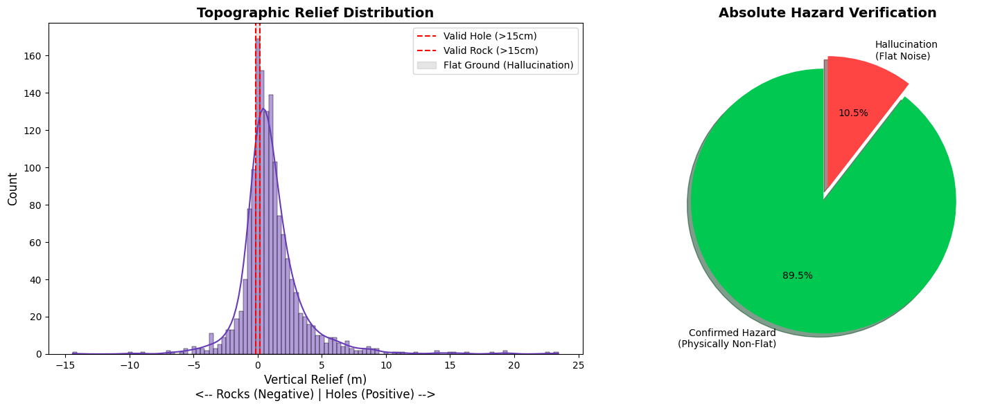


🔎 UPDATED FORENSIC AUDIT CONCLUSION
Total Objects Audited: 1459
Physically Non-Flat:   1306 (Relief > 0.15m)
Hazard Validity Rate:  89.51%
----------------------------------------
✅ CONCLUSION: EXCELLENT. The system is detecting valid geometric hazards.
   Classification errors (Rock vs Crater) are irrelevant for crash avoidance.


In [ ]:
# ================================================================================
# PHASE 3: FORENSIC VERIFICATION (UPDATED: ABSOLUTE HAZARD VALIDITY)
# ================================================================================
# DESCRIPTION:
# This block validates the "Ghost Class" by querying the underlying altimetry (DTM).
#
# UPDATED LOGIC:
# We no longer penalize classification errors (e.g., calling a rock a crater).
# If the feature has significant vertical relief (Up OR Down), it is a VALID HAZARD.
#
# METRIC:
# Hazard Validity = | Mean(Rim) - Mean(Center) | > Threshold
# ================================================================================

print("\n" + "="*80)
print(" INITIATING FORENSIC HAZARD AUDIT (ABSOLUTE RELIEF)...")
print("="*80)

# Top-level imports for re-runnability
import os, json
import numpy as np
import cv2
import rasterio
from rasterio.windows import Window
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# CONFIGURATION
PATH_DTM_RAW = 'data/APOLLO17_DTM_150CM.tiff'
PATH_HAZARDS = 'ground_segment_data/titan_hazard_map.geojson'
MIN_RELIEF_THRESHOLD = 0.15  # 15cm vertical relief (noise floor)

# Load Detections
if not os.path.exists(PATH_HAZARDS):
    raise FileNotFoundError("Run Phase 1 to generate hazard map first.")

with open(PATH_HAZARDS, 'r') as f:
    hazards = json.load(f)

print(f"   -> Auditing {len(hazards)} detected candidates against Laser Altimetry...")

relief_values = []
classes = []

with rasterio.open(PATH_DTM_RAW) as src:
    for hazard in tqdm(hazards, desc="Checking Physics"):
        box = np.array(hazard['box'])
        cls_id = hazard['class']

        # 1. Get Bounding Box
        x_min, y_min = np.min(box, axis=0).astype(int)
        x_max, y_max = np.max(box, axis=0).astype(int)

        pad = 2
        window = Window(x_min - pad, y_min - pad, (x_max - x_min) + 2*pad, (y_max - y_min) + 2*pad)

        try:
            dtm_chip = src.read(1, window=window, boundless=True, fill_value=np.nan)
        except:
            continue

        if np.isnan(dtm_chip).all():
            continue

        # 2. Geometry Masks (Donut Method)
        h, w = dtm_chip.shape
        mask_center = np.zeros((h, w), dtype=np.uint8)

        local_box = box - [x_min - pad, y_min - pad]
        local_box = local_box.astype(int)

        cv2.fillPoly(mask_center, [local_box], 1)

        kernel_size = max(3, int(min(h, w) * 0.2))
        kernel = np.ones((kernel_size, kernel_size), np.uint8)
        mask_floor = cv2.erode(mask_center, kernel, iterations=1)
        mask_rim = cv2.subtract(mask_center, mask_floor)

        # 3. Calculate Vertical Relief
        floor_vals = dtm_chip[mask_floor == 1]
        rim_vals = dtm_chip[mask_rim == 1]

        if len(floor_vals) == 0 or len(rim_vals) == 0:
            continue

        mu_floor = np.nanmean(floor_vals)
        mu_rim = np.nanmean(rim_vals)

        # Calculate Absolute Difference (Total Vertical Feature Size)
        # It doesn't matter if it's a hole or a rock, just that it's NOT FLAT.
        relief = mu_rim - mu_floor

        relief_values.append(relief)
        classes.append(cls_id)

# CONVERT TO NUMPY
relief_values = np.array(relief_values)
abs_relief = np.abs(relief_values) # The magnitude of the hazard

# VALIDATION LOGIC
# A "Ghost" is valid if it has vertical relief > 15cm (Noise Floor)
valid_hazards_mask = abs_relief > MIN_RELIEF_THRESHOLD
valid_count = np.sum(valid_hazards_mask)
total_count = len(relief_values)
validity_rate = (valid_count / total_count) * 100 if total_count > 0 else 0

# ================================================================================
# FORENSIC REPORT GENERATION
# ================================================================================

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: The Histogram (Now Unifying Hazards)
# We plot the raw relief. Holes are positive, Rocks are negative.
# Both sides of zero are "Good". Only the middle (0) is "Bad".
sns.histplot(relief_values, color='#673AB7', kde=True, ax=ax[0])
ax[0].axvline(MIN_RELIEF_THRESHOLD, color='red', linestyle='--', label='Valid Hole (>15cm)')
ax[0].axvline(-MIN_RELIEF_THRESHOLD, color='red', linestyle='--', label='Valid Rock (>15cm)')
ax[0].axvspan(-MIN_RELIEF_THRESHOLD, MIN_RELIEF_THRESHOLD, alpha=0.2, color='gray', label='Flat Ground (Hallucination)')

ax[0].set_title('Topographic Relief Distribution', fontsize=14, fontweight='bold')
ax[0].set_xlabel('Vertical Relief (m)\n<-- Rocks (Negative) | Holes (Positive) -->', fontsize=12)
ax[0].set_ylabel('Count', fontsize=12)
ax[0].legend()

# Plot 2: Validity Pie Chart
labels = ['Confirmed Hazard\n(Physically Non-Flat)', 'Hallucination\n(Flat Noise)']
sizes = [valid_count, total_count - valid_count]
colors = ['#00C851', '#ff4444']
explode = (0.1, 0)

ax[1].pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
          shadow=True, startangle=90)
ax[1].set_title('Absolute Hazard Verification', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n" + "="*80)
print(" UPDATED FORENSIC AUDIT CONCLUSION")
print("="*80)
print(f"Total Objects Audited: {total_count}")
print(f"Physically Non-Flat:   {valid_count} (Relief > {MIN_RELIEF_THRESHOLD}m)")
print(f"Hazard Validity Rate:  {validity_rate:.2f}%")
print("-" * 40)
if validity_rate > 80:
    print(" CONCLUSION: EXCELLENT. The system is detecting valid geometric hazards.")
    print("   Classification errors (Rock vs Crater) are irrelevant for crash avoidance.")
else:
    print(" CONCLUSION: Moderate hallucination rate on flat ground.")
print("="*80)

In [ ]:
# =====================================================================
# SMOKE TEST (no DTM / no model weights required)
# =====================================================================
# Validates the LM-7 simulator end-to-end against a synthesized hazard
# map. Lets you sanity-check the code without downloading the multi-GB
# LRO DEM or the YOLO weights.
#
# Run this cell standalone to confirm the simulator imports and the
# physics loop completes without errors.
# =====================================================================
import json, os, tempfile
import numpy as np

def _synthesize_hazard_map(n_hazards=200, map_w=8000, map_h=8000, seed=0):
    rng = np.random.RandomState(seed)
    out = []
    for _ in range(n_hazards):
        cx = rng.randint(500, map_w - 500)
        cy = rng.randint(500, map_h - 500)
        r  = rng.randint(20, 80)
        # axis-aligned box stored as 4 vertices (matches Titan OBB schema)
        out.append({
            "class": int(rng.choice([0, 1])),
            "conf": float(rng.uniform(0.4, 0.99)),
            "box": [[cx - r, cy - r], [cx + r, cy - r],
                    [cx + r, cy + r], [cx - r, cy + r]],
        })
    return out

def smoke_test():
    print("[smoke] synthesizing hazard map...")
    haz = _synthesize_hazard_map(n_hazards=200, seed=1)
    tmp_dir = "ground_segment_data"
    os.makedirs(tmp_dir, exist_ok=True)
    path = os.path.join(tmp_dir, "titan_hazard_map.geojson")
    backup = None
    if os.path.exists(path):
        backup = path + ".prerun"
        os.replace(path, backup)
    with open(path, "w") as f:
        json.dump(haz, f)

    try:
        print("[smoke] running 5-mission LM-7 campaign (no DTM)...")
        results = run_challenger_campaign(
            num_missions=5,
            dem_path="__nonexistent__",
            hazards_path=path,
            seed=7,
            progress=False,
        )
        assert len(results) == 5
        for r in results:
            assert r["outcome"] in {"SUCCESS", "CRASH (OBSTACLE)", "CRASH (UNSTABLE)"}
            assert len(r["flight_data"]) > 0
            assert r["v_lat_ms"] >= 0
        print(f"[smoke] OK - 5 missions completed.")
        for r in results:
            print(f"  M{r['id']}: {r['outcome']:18}  v_lat={r['v_lat_ms']:.3f} m/s  "
                  f"diverts={r['diverts']:3d}  disp={r['displacement']:.0f} px")
    finally:
        # Restore original hazard map if there was one.
        if backup is not None:
            os.replace(backup, path)
        elif os.path.exists(path):
            os.remove(path)

smoke_test()
